In [1]:
# TO DO:
#   - classification (return name and score) // text from image
#   - colab

import os
import glob


# path where generated imgs are stored
gen_base_path = os.path.join("datasets", "generated") 


# path to indoor images
indoor_categories_path = "datasets/indoorCVPT_09/Images"  # local


# SCULPTURE 
sculp_maps_basepath = "datasets\sculpture6k_dataset\sculptures6k_segmentations//train"

sculp_dataset_name = "datasets\\sculpture6k_dataset\\sculptures6k_images\\train"

sclp_images_paths = glob.glob(os.path.join(os.getcwd(), sculp_dataset_name, "*"))
#_______


# WIKIART 
wikiart_base_path = "datasets\\wikiart"  # local

wikiart_images_paths = glob.glob(f"{wikiart_base_path}/*")
#_______

print("sclp_images_paths[0]", sclp_images_paths[0])
print("\nwikiart_images_paths[0]", wikiart_images_paths[0])

sclp_images_paths[0] C:\Users\mykha\Desktop\onnx_segment_anything_experiments\datasets\sculpture6k_dataset\sculptures6k_images\train\Henry_Moore_Arch_Leg_0000.jpg

wikiart_images_paths[0] datasets\wikiart\58. Middle Aged Lady Standing Against a Background of Wheat 2017  by Anthony D. Padgett (after Young Girl by Van Gogh Auvers Sur Oise 1890)___Anthony Padgett.png


In [2]:
import numpy as np

import torch 
import torchvision # for read_image # import cv2

import torch.nn as nn

from torchvision.models import resnet50, ResNet50_Weights

from torchmetrics import MeanSquaredError

if torch.cuda.is_available(): 
     dev = "cuda:0" 
else: 
     dev = "cpu" 
        
device = torch.device(dev) 
print("device :", device)


import PIL 
from matplotlib import pyplot as plt


metric = MeanSquaredError().to(device) # mean (a - b) ^ 2

device : cuda:0


In [3]:
# ##  🤗 (how change transformer output shape ?)

# # # pip install git+https://github.com/huggingface/transformers
# # # pip install git+https://github.com/huggingface/datasets

# from transformers import AutoImageProcessor, ViTModel
# import torch
# from datasets import load_dataset

# dataset = load_dataset("huggingface/cats-image")
# image = dataset["test"]["image"][0]

# image_processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
# model = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k")

# inputs = image_processor(image, return_tensors="pt")

# with torch.no_grad():
#     outputs = model(**inputs)

# last_hidden_states = outputs.last_hidden_state
# list(last_hidden_states.shape)

In [4]:
# Different preprocess functions
# https://github.com/microsoft/onnxruntime-inference-examples/issues/234

from torchvision import transforms

preprocess3 = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224, 224)),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])

def preprocess2(item):
    item = item.resize((224, 224))
    item = np.array(item, dtype=np.float64)
    item[:,:, 0] = (item[:,:, 0] /255.0 - 0.485) / 0.229

    item[:,:, 1] = (item[:,:, 1] /255.0 - 0.456) / 0.224
    item[:,:, 2] = (item[:,:, 2] /255.0 - 0.406) / 0.225
    return torch.tensor(np.array(item), dtype=torch.float).permute(2, 1, 0)

In [5]:
# Model (which should replace sam predictor)

    
def create_model():
    weights = ResNet50_Weights.DEFAULT
    model = resnet50(weights=weights)
    model.eval()
    model.to(device)
    
    # Preprocess
    preprocess = weights.transforms()


    # Create embeddings model
    modules=list(model.children())[:-1] # -5

    #
    emb_model =nn.Sequential(*modules)
    for p in model.parameters():
        p.requires_grad = False 


        ############

    return emb_model, preprocess

emb_model, preprocess = create_model()

In [6]:
preprocess

ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [7]:
img = PIL.Image.open(wikiart_images_paths[0])
img = img.convert("RGB") 
img = preprocess(img).unsqueeze(0).to(device)

In [8]:
# EMB_SHAPE = 
EMB_SHAPE = list(emb_model(img).shape)
print(EMB_SHAPE) # sam predictor output shape [1, 256, 64, 64]  # [1, 2048, 1, 1]

[1, 2048, 1, 1]


In [9]:
# iOS and OpenCV 
# https://medium.com/onfido-tech/building-a-simple-lane-detection-ios-app-using-opencv-4f70d8a6e6bc
#
# https://pytorch.org/vision/stable/models.html

def chunks(lst, n):
    for i in range(0, len(lst), n):
        yield lst[i:i + n]
        
        
def get_image_data(paths, emb_model, preprocess):
    batch_size = 10

    def read_image(img_data):
        
        if isinstance(img_data, str):
            img_data = PIL.Image.open(img_data)
            
        img_data = img_data.convert("RGB")  # sculptures - BGR
        img_data = preprocess(img_data).unsqueeze(0)

        return img_data
    
    imgs = list(map(lambda x: read_image(x), paths)) 
    
    if imgs is None:
        return None 

    el_paths = []

    img_chunks = list(chunks(imgs, batch_size))
    
    embeddings = torch.FloatTensor(size=[len(img_chunks) * batch_size, EMB_SHAPE[1], EMB_SHAPE[2], EMB_SHAPE[3]]).to(device)
    for ch_ind, chunk in enumerate(img_chunks):
        t_imgs = torch.Tensor(batch_size, 3, 224, 224)

        batch = torch.cat(chunk, out=t_imgs).to(device)

        start_ind = ch_ind*batch_size
        embeddings[start_ind:start_ind+batch_size, :, : , :] = emb_model(batch)

#         prediction = clf_model(batch).squeeze(0).softmax(0)
#         class_ids = prediction.argmax().item()
#         score = prediction[class_ids].item()
#         category_name = weights.meta["categories"][class_ids]
    
        el_paths.append(paths[start_ind:start_ind+batch_size])
    
    
    # helper func
    flat_paths=[]
    for sublist in el_paths:
        for element in sublist:
            flat_paths.append(element)
    ######

    
    return {"embeddings" : embeddings, "paths" : flat_paths} #" "category_name" : category_name score" : score


# # Test

# img_info_1 = get_image_data(sclp_images_paths[10:20], 
#                           emb_model, 
#                           preprocess, 
#                             weights)

In [10]:
# Utils 

def generate_random_test_dicts(size):
    rand_indexes = np.random.randint(len(sclp_images_paths) - 1, size=size)

    sclp_img_dict = get_image_data([sclp_images_paths[i] for i in rand_indexes], #<--- rename info_sets to image data
                                           emb_model,
                                           preprocess)


    wikiart_img_dict = get_image_data([wikiart_images_paths[i] for i in rand_indexes], 
                                           emb_model,
                                           preprocess)
    
    return sclp_img_dict, wikiart_img_dict


# # Test

# sclp_img_dict, wikiart_img_dict = generate_random_test_dicts(100)

# print(mean_squared_error(sclp_img_info_set["embeddings"], sclp_img_info_set["embeddings"]))

# print(mean_squared_error(sclp_img_info_set["embeddings"], wikiart_img_info_set["embeddings"]))
# print(mean_squared_error(wikiart_img_info_set["embeddings"], sclp_img_info_set["embeddings"]))

In [11]:
import time 

# test_ranges = np.logspace(1,10,num=10,base=10,dtype='int')[0:2]
# print("test_ranges" , test_ranges)

# for i_test_len in test_ranges:
i_test_len = 100
start_time = time.time()
large_sclp_img_dict, large_wikiart_img_dict = generate_random_test_dicts(i_test_len)  # search space
print("time", time.time() - start_time)

time 4.444451570510864


In [12]:
# generate test set / user input
test_count = 20
test_sclp_img_dict, test_wikiart_img_dict = generate_random_test_dicts(test_count)

In [83]:
#  Metrics result generation

res_dict = {}
res_dict[i_test_len] = {}

test_dict = test_wikiart_img_dict # test_wikiart_img_dict # test_sclp_img_dict

for i in range(test_count):
    
    start_time = time.time()
    
    # copy every test larn n times to make MSE calculation available because of same shapes
    repeated_test_values = [test_dict['embeddings'][i] for c_i in range(large_sclp_img_dict["embeddings"].shape[0])]
    repeated_test_values= torch.stack(repeated_test_values, dim=0).to(device)
    
    
    distance_to_sclp = metric(repeated_test_values, large_sclp_img_dict["embeddings"])
    distance_to_wiki = metric(repeated_test_values, large_wikiart_img_dict["embeddings"])
    

    #wikiart_sclp_avg_dist = mean_squared_error(wikiart_img_info_set["embeddings"], sclp_img_info_set["embeddings"])
    
    item_dict = {"distance_to_sclp" : distance_to_sclp.item(),
                 "distance_to_wiki" : distance_to_wiki.item(),
                 "inner_std" : repeated_test_values.std().item(),
                 "path":test_dict['paths'][i],
                 "exec_time":time.time() - start_time}

    res_dict[i_test_len][i] = {}
    res_dict[i_test_len][i] = item_dict

In [84]:
res_dict[i_test_len][7]

{'distance_to_sclp': 0.17790311574935913,
 'distance_to_wiki': 0.1052297055721283,
 'inner_std': 0.28900349140167236,
 'path': 'datasets\\wikiart\\603A  Sunset___Friedensreich Hundertwasser.png',
 'exec_time': 0.003997325897216797}

distance_to_wiki 0.1052297055721283
distance_to_sclp 0.17790311574935913
inner_std 0.28900349140167236
incorrect


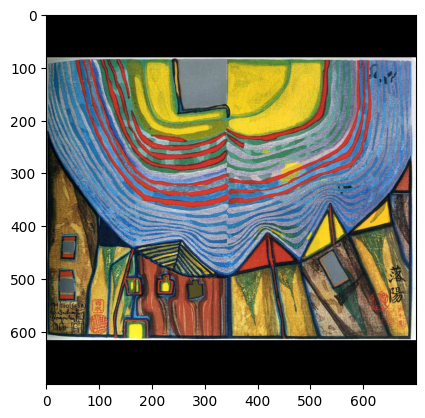



distance_to_wiki 0.11255407333374023
distance_to_sclp 0.2006780207157135
inner_std 0.3404656648635864
incorrect


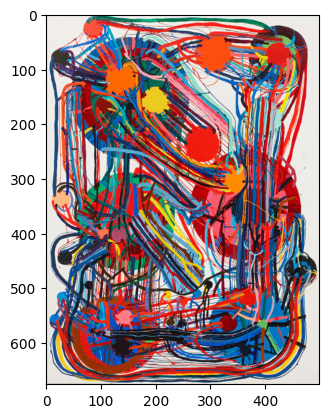



distance_to_wiki 0.14486855268478394
distance_to_sclp 0.24776962399482727
inner_std 0.38549092411994934
incorrect


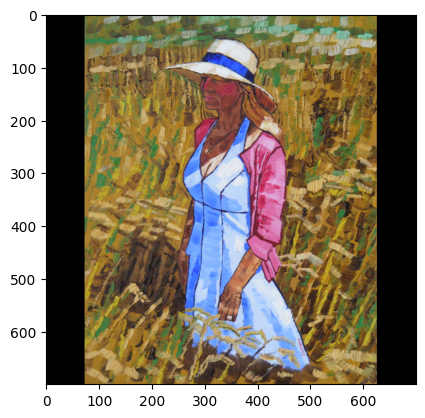



distance_to_wiki 0.14486855268478394
distance_to_sclp 0.24776962399482727
inner_std 0.38549092411994934
incorrect


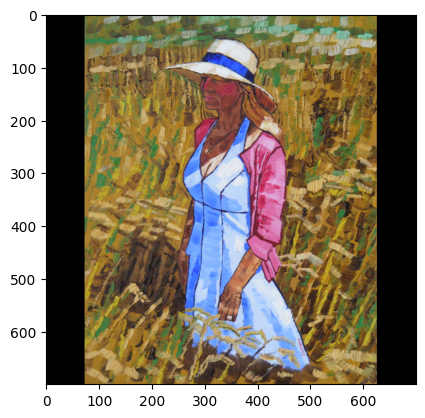



distance_to_wiki 0.11255407333374023
distance_to_sclp 0.2006780207157135
inner_std 0.3404656648635864
incorrect


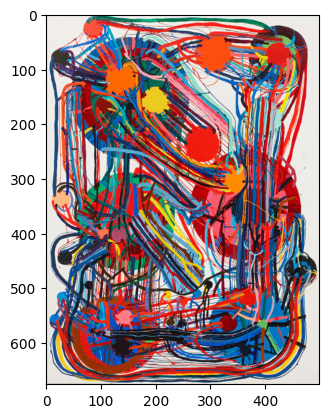



distance_to_wiki 0.11255407333374023
distance_to_sclp 0.2006780207157135
inner_std 0.3404656648635864
incorrect


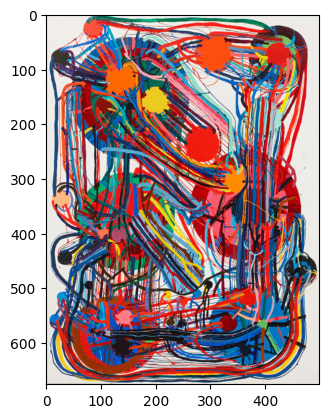



distance_to_wiki 0.14486855268478394
distance_to_sclp 0.24776962399482727
inner_std 0.38549092411994934
incorrect


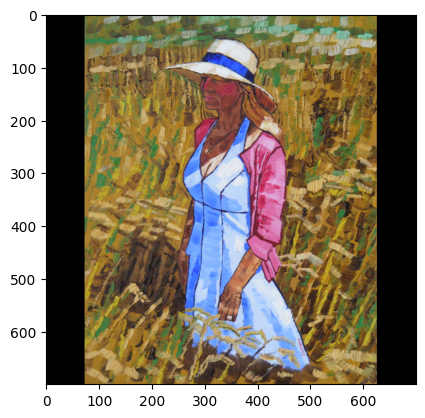



distance_to_wiki 0.1052297055721283
distance_to_sclp 0.17790311574935913
inner_std 0.28900349140167236
incorrect


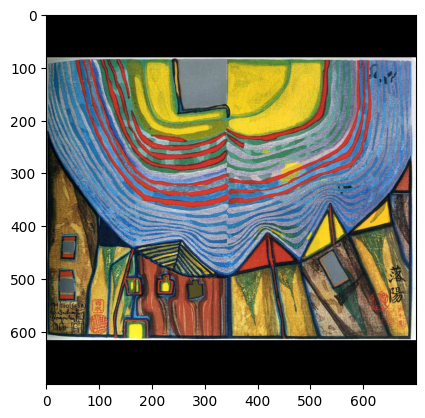



distance_to_wiki 0.11255407333374023
distance_to_sclp 0.2006780207157135
inner_std 0.3404656648635864
incorrect


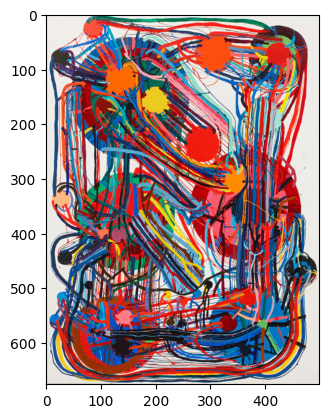



distance_to_wiki 0.1052297055721283
distance_to_sclp 0.17790311574935913
inner_std 0.28900349140167236
incorrect


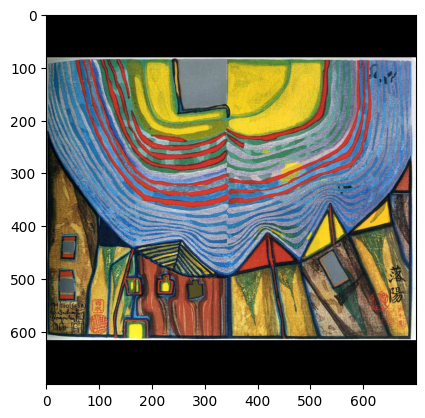



distance_to_wiki 0.14486855268478394
distance_to_sclp 0.24776962399482727
inner_std 0.38549092411994934
incorrect


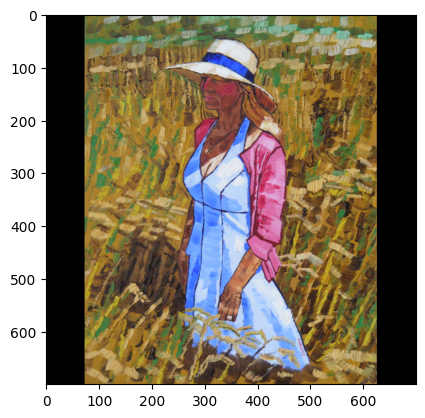



distance_to_wiki 0.14486855268478394
distance_to_sclp 0.24776962399482727
inner_std 0.38549092411994934
incorrect


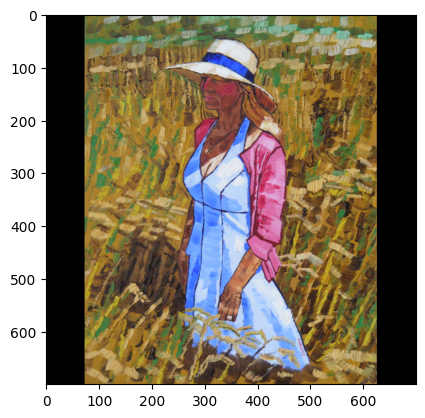



distance_to_wiki 0.11255407333374023
distance_to_sclp 0.2006780207157135
inner_std 0.3404656648635864
incorrect


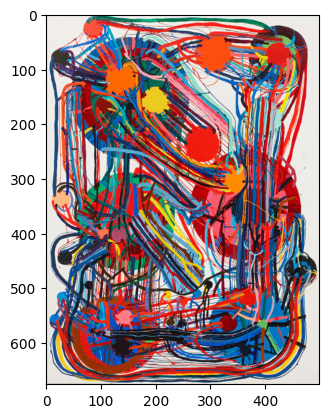



distance_to_wiki 0.11255407333374023
distance_to_sclp 0.2006780207157135
inner_std 0.3404656648635864
incorrect


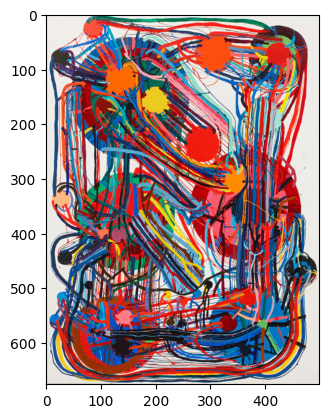



distance_to_wiki 0.14486855268478394
distance_to_sclp 0.24776962399482727
inner_std 0.38549092411994934
incorrect


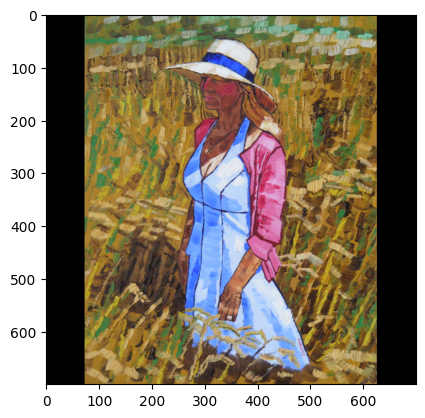



distance_to_wiki 0.1052297055721283
distance_to_sclp 0.17790311574935913
inner_std 0.28900349140167236
incorrect


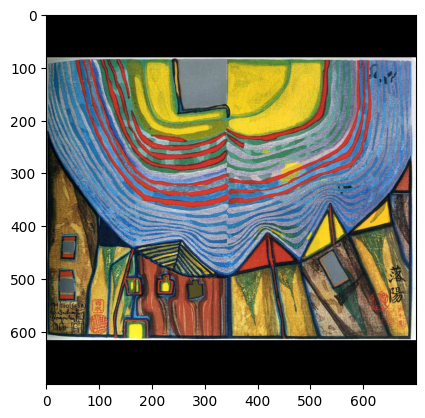



distance_to_wiki 0.14486855268478394
distance_to_sclp 0.24776962399482727
inner_std 0.38549092411994934
incorrect


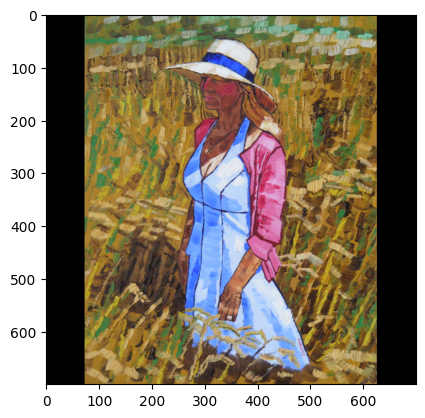



distance_to_wiki 0.1052297055721283
distance_to_sclp 0.17790311574935913
inner_std 0.28900349140167236
incorrect


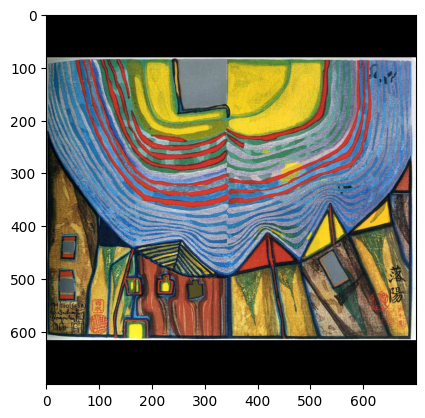



distance_to_wiki 0.11255407333374023
distance_to_sclp 0.2006780207157135
inner_std 0.3404656648635864
incorrect


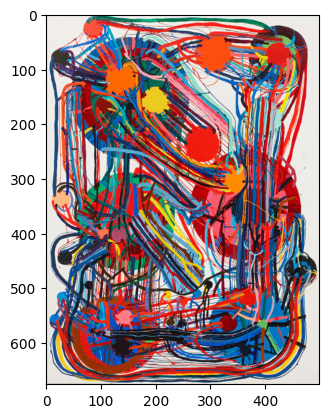



distance_to_wiki 0.1052297055721283
distance_to_sclp 0.17790311574935913
inner_std 0.28900349140167236
incorrect


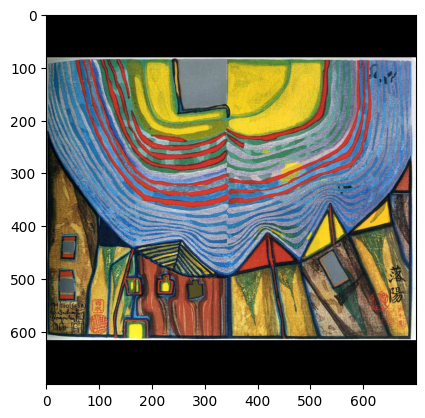



acc 0.0


In [85]:
# #  Visualize 

correct = 0
all_count = 0

for c_test_len in list(res_dict.keys()):
    for c_item in res_dict[c_test_len].values():

        img_path = c_item["path"]
        distance_to_wiki = c_item["distance_to_wiki"]
        distance_to_sclp = c_item["distance_to_sclp"]
        
        print("distance_to_wiki", distance_to_wiki)
        print("distance_to_sclp", distance_to_sclp)
        print("inner_std", c_item["inner_std"])

        is_sclp = "sculpture6k_dataset" in img_path
        
        if distance_to_sclp < distance_to_wiki and is_sclp:
            correct += 1
            print("correct")
        else:
            print("incorrect")
            
        all_count += 1
        img = PIL.Image.open(img_path)
        img = img.convert("RGB")

        plt.imshow(img)
        plt.show()
        print("\n")
        
        
print("acc",  correct / all_count)

In [ ]:
# (SAM segmentation)
# (https://www.kaggle.com/datasets/luznoc/synthetic-dataset-for-home-interior)

# Paintings always classified as sculptures 

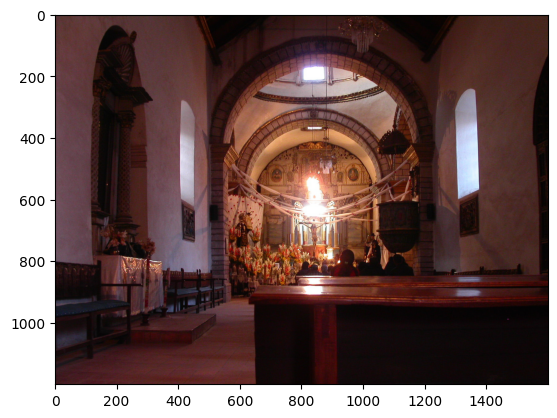

In [86]:
indoor_cat_list = list(map(lambda x: x.split("\\")[-1], glob.glob(os.path.join(indoor_categories_path, "*"))))

selected_indoor_img_paths = glob.glob(os.path.join(indoor_categories_path, indoor_cat_list[0], "*"))

rand_indoor_img_path = np.random.choice(selected_indoor_img_paths)

indoor_img = PIL.Image.open(rand_indoor_img_path)
indoor_img = indoor_img.convert("RGBA")
plt.imshow(indoor_img)
plt.show()

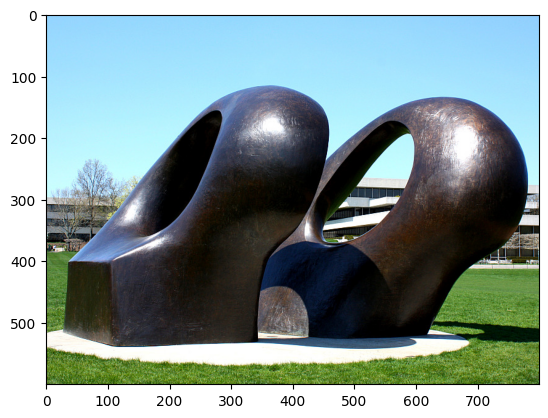

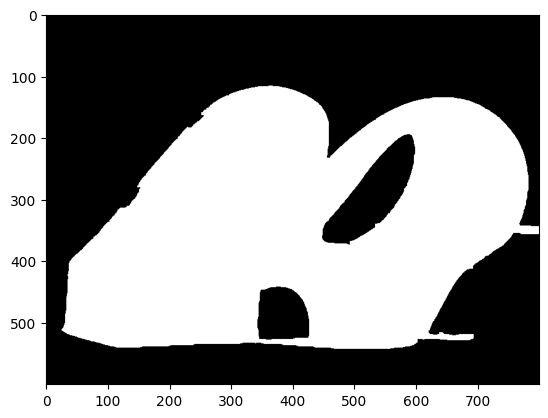

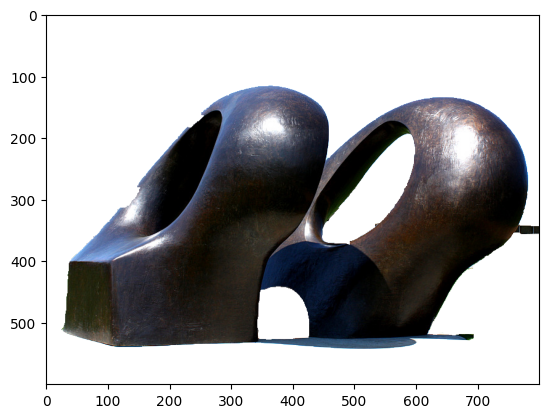

In [89]:
artwork_img_path = np.random.choice(sclp_images_paths) # wikiart_images_paths # sclp_images_paths
artwork_img = PIL.Image.open(artwork_img_path) 
artwork_img = artwork_img.convert("RGBA")
plt.imshow(artwork_img)
plt.show()


# Segmentation of sculp imgs
is_segment = True
if "sculp" in artwork_img_path and is_segment:
    sculp_maps_paths = glob.glob(os.path.join(sculp_maps_basepath, "*"))
    
    selected_map_id = artwork_img_path.split("\\")[-1].split(".")[0] # maps and images have different format so here we need to remove jpg
    selected_map_img = PIL.Image.open(os.path.join(sculp_maps_basepath, selected_map_id + ".png"))
    

    plt.imshow(selected_map_img)
    plt.show()

    result = np.array(artwork_img)
    result[:, :, 3] *= np.array(selected_map_img, dtype="uint8")

    # segmented_sculp_img = np.stack([np.multiply(result[:, :, 0], selected_map),
    #                    np.multiply(result[:, :, 1], selected_map), 
    #                    np.multiply(result[:, :, 2], selected_map)], axis=2)

    plt.imshow(result)
    plt.show()

else:
    result = np.array(artwork_img)
    
#############

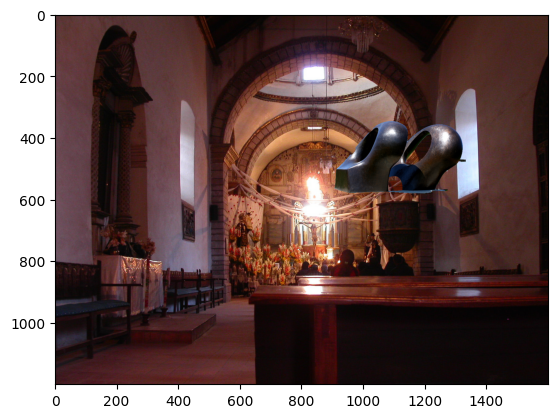

In [90]:
# https://stackoverflow.com/questions/15721094/detecting-mouse-event-in-an-image-with-matplotlib

# TO DO:
# - resize proportionally to background

def trans_paste(bg_img,fg_img,box=(0,0)):
    fg_img_trans = PIL.Image.new("RGBA",bg_img.size)
    fg_img_trans.paste(fg_img,box,mask=fg_img)
    new_img = PIL.Image.alpha_composite(bg_img,fg_img_trans)
    return new_img


test_img = PIL.Image.fromarray(result)

# x, y, w, h - for insertion calculation
img_ratio =  test_img.size[1] /  test_img.size[0] # h / w

insrt_width = np.random.randint(int(indoor_img.size[0] / 6), 
                                int(indoor_img.size[0] / 3))

insrt_height = int(insrt_width * img_ratio)

x = np.random.randint(0, indoor_img.size[0] - insrt_width) 
y = np.random.randint(0, indoor_img.size[1] - insrt_height) 
####

test_img = test_img.resize((insrt_width, insrt_height))

res = trans_paste(indoor_img, test_img, (x, y))

plt.imshow(res)
plt.show()

In [91]:
test_img_dict = get_image_data([res], 
                               emb_model,
                               preprocess)

C:\Users\mykha\AppData\Local\Temp\ipykernel_272\2760782688.py:37: UserWarning: An output with one or more elements was resized since it had shape [10, 3, 224, 224], which does not match the required output shape [1, 3, 224, 224]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\Resize.cpp:24.)
  batch = torch.cat(chunk, out=t_imgs).to(device)


In [92]:
test_img_dict["embeddings"].shape

torch.Size([10, 256, 64, 64])

In [ ]:
# sam predictor emb shape (1, 256, 64, 64)


In [ ]:
1/0 # stop the exec

In [ ]:
#######################################

In [ ]:
#######################################

In [ ]:
#######################################bb

In [ ]:
# SAM ANNO TOOL

In [13]:
import numpy as np
import onnxruntime
from segment_anything import sam_model_registry, SamPredictor

def show_mask(mask, ax):
    
    color = np.array([np.random.randint(0, 255)/255, np.random.randint(0, 255)/255, np.random.randint(0, 255)/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='blue', marker='o', s=marker_size, edgecolor='yellow', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='o', s=marker_size, edgecolor='white', linewidth=1.25) 
    
checkpoint = r"C:\Users\mykha\Desktop\ART\segment-anything\sam_vit_b_01ec64.pth"
model_type = "vit_b"

sam = sam_model_registry[model_type](checkpoint=checkpoint)
onnx_model_path = r"C:\Users\mykha\Desktop\ART\segment-anything\sam_onnx_example.onnx"
ort_session = onnxruntime.InferenceSession(onnx_model_path)

sam.to(device='cuda')
predictor = SamPredictor(sam)

def predict(image, ort_session, predictor, input_point, input_label, image_embedding = None):
    if image_embedding is None:
        predictor.set_image(image)
        image_embedding = predictor.get_image_embedding().cpu().numpy()


    onnx_coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
    onnx_label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)

    onnx_coord = predictor.transform.apply_coords(onnx_coord, image.shape[:2]).astype(np.float32)

    onnx_mask_input = np.zeros((1, 1, 256, 256), dtype=np.float32)
    onnx_has_mask_input = np.zeros(1, dtype=np.float32)
    
    ort_inputs = {
        "image_embeddings": image_embedding,
        "point_coords": onnx_coord,
        "point_labels": onnx_label,
        "mask_input": onnx_mask_input,
        "has_mask_input": onnx_has_mask_input,
        "orig_im_size": np.array(image.shape[:2], dtype=np.float32)
    }

    masks, _, low_res_logits = ort_session.run(None, ort_inputs)
    masks = masks > predictor.model.mask_threshold
    
    return masks, image_embedding


image =  np.random.rand(1024, 1024, 3).astype(np.uint8) #np.array(indoor_img.resize((1024, 1024), PIL.Image.Resampling.BICUBIC).convert("RGB"))
input_point = np.array([[500, 375]])
input_label = np.array([1])
    
sam_masks, image_embedding = predict(image, ort_session, predictor, input_point, input_label)

In [ ]:
artwork_img_path = np.random.choice(wikiart_images_paths) # wikiart_images_paths # sclp_images_paths
artwork_img = PIL.Image.open(artwork_img_path) 
artwork_id = artwork_img_path.split(os.sep)[-1].split(".")[0]

gen_dataset_end_point = "sculp" if "sculp" in artwork_img_path else "wiki"
gen_save_dataset_path = os.path.join(gen_base_path, gen_dataset_end_point)

### 
###  #breaks matplotlib need to refresh everything after running this cell
%matplotlib notebook  
### 
###

image = np.array(artwork_img.resize((1024, 1024), PIL.Image.Resampling.BICUBIC).convert("RGB"))

    
ax = plt.gca()
fig = plt.gcf()
implot = ax.imshow(image)

meta_data_l = []

def onclick(event):
    if event.xdata != None and event.ydata != None:
        input_point = np.array([[event.xdata, event.ydata]])
        input_label = np.array([1])

        sam_masks, image_embedding = predict(image, ort_session, predictor, input_point, input_label)
        
        show_mask(sam_masks, plt.gca())
        show_points(input_point, input_label, plt.gca())
        
        meta_data_l.append([input_point, input_label, sam_masks, image_embedding])


            
def on_press(event):
    if event.key == "x":
        
        plt.clf()

        points = []

        plt.imshow(image)
        plt.show()
        

cid = fig.canvas.mpl_connect('key_press_event', on_press)

cid = fig.canvas.mpl_connect('button_press_event', onclick)

plt.show()

In [ ]:
# SAVE __________ YOU NEED TO RUN THIS CELL TO STORE RESULT (move it to callback) :(
# https://stackoverflow.com/questions/65339552/how-to-convert-dictionary-with-numpy-array-to-json-and-back
import json

if len(meta_data_l) == 0:
    print("meta_data_l is empty")


for ind, msk in enumerate(meta_data_l):
    input_point, input_label, msk, image_embedding = msk
    svg_dict = {}
    svg_dict["input_point"] = input_point
    svg_dict["input_label"] = input_label
    svg_dict["image_embedding"] = image_embedding

    
    save_base_path = os.path.join(gen_save_dataset_path, artwork_id)
    if os.path.exists(save_base_path) is False:
        os.makedirs(save_base_path)

    
    npy_path = os.path.join(save_base_path, f"data_{ind}.npy")
    print(npy_path)
    np.save(npy_path,  svg_dict)   


#     json_path = os.path.join(save_base_path, f"data_{ind}.json")
#     print(json_path)
#     with open(json_path, 'w') as f:
#         json1 = json.dumps({k: v.tolist() for k, v in svg_dict.items()})
#         json.dump(json1, f)
              
    img = PIL.Image.fromarray(msk[0,0])

    img.save(os.path.join(save_base_path, f"img_{ind}.png"),"PNG")

In [ ]:
### Training
# https://pytorch.org/tutorials/beginner/introyt/trainingyt.html

# Colab https://colab.research.google.com/drive/1Vl_U28Pq5dYYqUuKkqYEnXnQrWjNg_ti#scrollTo=zRJgNVGA23m6



In [ ]:
plt.clf()

In [35]:
import torch 
import numpy as np 
import PIL

# Try to find something simple

artwork_img_path = np.random.choice(wikiart_images_paths) # wikiart_images_paths # sclp_images_paths
artwork_img = PIL.Image.open(artwork_img_path) 
artwork_id = artwork_img_path.split(os.sep)[-1].split(".")[0]

gen_dataset_end_point = "sculp" if "sculp" in artwork_img_path else "wiki"
gen_save_dataset_path = os.path.join(gen_base_path, gen_dataset_end_point)
# ids = glob.glob(os.path.join(gen_base_path, gen_dataset_end_point, '*'))    

image = np.array(artwork_img.resize((1024, 1024), PIL.Image.Resampling.BICUBIC).convert("RGB"))


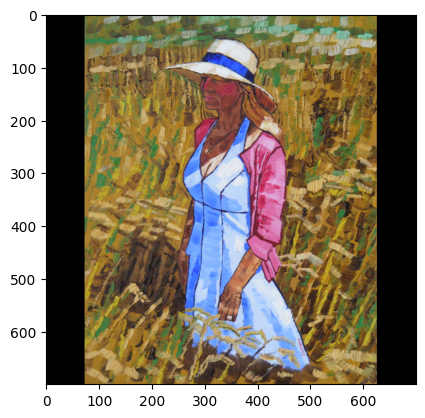

In [36]:
plt.imshow(artwork_img)

In [56]:

from tqdm import tqdm

def show_rand_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color=np.random.rand(3,), marker='o', s=marker_size, edgecolor=np.random.rand(3,), linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color=np.random.rand(3,), marker='o', s=marker_size, edgecolor=np.random.rand(3,), linewidth=1.25) 
    
    


loss_values = []

res_path = r"datasets\results"

rand_x = np.random.randint(image.shape[0])
rand_y = np.random.randint(image.shape[1])
    
input_point = np.array([[rand_x, rand_y]])
input_label = np.array([1])
sam_masks, image_embedding = predict(image, 
                                 ort_session, 
                                 predictor, 
                                 input_point, 
                                 input_label) # inf_image_embedding.cpu().detach().numpy()



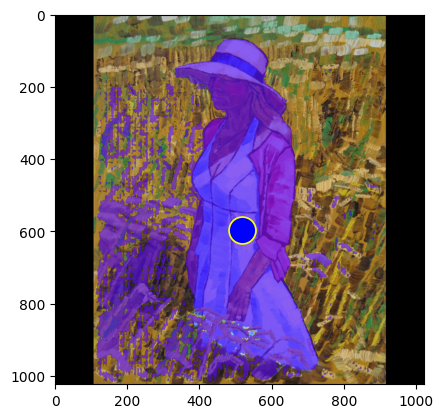

In [57]:
import matplotlib.pyplot as plt
ax = plt.gca()
fig = plt.gcf()
implot = ax.imshow(image)
show_mask(sam_masks, plt.gca())
show_points(input_point, input_label, plt.gca())

In [45]:
input_point

array([[184, 886]])

In [60]:
def create_model():
    weights = ResNet50_Weights.DEFAULT
    model = resnet50(weights=weights)
    model.to(device)
    
    # Preprocess
    preprocess = weights.transforms()


    # Create embeddings model
    modules=list(model.children())[:-5] # -5

    #
    emb_model =nn.Sequential(*modules)
#     for p in model.parameters():
#         p.requires_grad = False 


        ############


    # # Add new layers to make shape same to SAM mask encoder input emb shape
    features = nn.ModuleList(emb_model.children())[:-5]
    model_features = nn.Sequential(*features) 
    some_more_layers = nn.Sequential(nn.Conv2d(3, 256, (163, 163), stride=(1, 1), padding=(1, 1), dilation=(1, 1))) 

    emb_model = nn.Sequential(model_features, 
                          some_more_layers).to(device)
    return emb_model, preprocess

emb_model, preprocess = create_model()

# preprocess = preprocess3 # !!!!

img = PIL.Image.open(artwork_img_path)
img = img.convert("RGB") 
img = preprocess(img).unsqueeze(0).to(device)
EMB_SHAPE = list(emb_model(img).shape)
print(EMB_SHAPE)
# model, preprocess = create_model()
# optimizer = torch.optim.SGD(emb_model.parameters(), lr=0.001)


[1, 256, 64, 64]


In [61]:
# import matplotlib
# matplotlib.use('Agg') # for image storage

In [62]:
from segment_anything import sam_model_registry, SamPredictor
from segment_anything.utils.onnx import SamOnnxModel

checkpoint = r"segment-anything\sam_vit_b_01ec64.pth"
model_type = "vit_b"
sam = sam_model_registry[model_type](checkpoint=checkpoint)
onnx_model = SamOnnxModel(sam, return_single_mask=True).to(device)

In [63]:
mask_enc_optimizer = torch.optim.Adam(onnx_model.parameters(), lr=0.000001)
optimizer = torch.optim.Adam(emb_model.parameters(), lr=0.000001)


In [64]:
for p in onnx_model.parameters():
    p.requires_grad = True 

In [65]:
import PIL
import copy 
import time


since = time.time()

mask_input_size =[256, 256]

val_acc_history = []

best_acc = 0.0

t_image = PIL.Image.open(artwork_img_path)
t_image = t_image.convert("RGB") 
inputs = preprocess(t_image).unsqueeze(0).to(device)
outputs = emb_model(inputs)

# rand_labels = np.random.rand(1, 2048, 1, 1) # 1, 256, 64, 64 # 2048, 1, 1
labels = torch.tensor(image_embedding, dtype=torch.float32).to(device) #labels.to(device)

criterion = nn.MSELoss()
ce_loss = nn.BCELoss() #CrossEntropyLoss()    


gt_inputs = {
    "image_embeddings": torch.Tensor(image_embedding).to(device),# torch.randn(1, embed_dim, *embed_size, dtype=torch.float),
    "point_coords": torch.Tensor([input_point]).to(device),
    "point_labels": torch.Tensor([input_label]).to(device),
    "mask_input": torch.randn(1, 1, *mask_input_size, dtype=torch.float).to(device),
    "has_mask_input": torch.tensor([1], dtype=torch.float).to(device),
    "orig_im_size": torch.tensor([1024, 1024], dtype=torch.float).to(device),
}

masks, _, low_res_logits = onnx_model(**gt_inputs)

th_masks = (masks > predictor.model.mask_threshold).type(torch.float)
        
        
def train_model(model, criterion, optimizer, num_iter=25):


    for epoch in range(num_iter):
        model.train()  # Set model to training mode

        optimizer.zero_grad()
        mask_enc_optimizer.zero_grad()
        outputs = model(inputs)

        inf_inputs = {
            "image_embeddings": torch.Tensor(outputs),# torch.randn(1, embed_dim, *embed_size, dtype=torch.float),
            "point_coords": torch.Tensor([input_point]).to(device),
            "point_labels": torch.Tensor([input_label]).to(device),
            "mask_input": torch.randn(1, 1, *mask_input_size, dtype=torch.float).to(device),
            "has_mask_input": torch.tensor([1], dtype=torch.float).to(device),
            "orig_im_size": torch.tensor([1024, 1024], dtype=torch.float).to(device),
        }

        inf_masks, _, low_res_logits = onnx_model(**inf_inputs)
        th_inf_masks =  (inf_masks > predictor.model.mask_threshold).type(torch.float) 
        
         
        ce_loss_val = criterion(inf_masks, masks)
        mse_loss_val = criterion(outputs, labels)
        print("masks loss", ce_loss_val.item())
        print("vectors loss", mse_loss_val.item())
        print("\n \n")
        loss = mse_loss_val + ce_loss_val

        loss.backward()
        optimizer.step()
        mask_enc_optimizer.step()
#         print(inf_masks.shape)
#         print(masks.shape)
#         print(ce_loss(inf_masks, masks)) #  STRANGE CRASH
#         print(criterion(outputs, labels))
#         print(ce_loss_val)

#         ce_loss_val.backward()
#         mask_enc_optimizer.step()

        
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))
    return model, val_acc_history

In [66]:
# Setup the loss fxn

# Train and evaluate
model_ft, hist = train_model(emb_model, criterion, optimizer, num_iter=1000)

masks loss 904.204833984375
vectors loss 0.3982527256011963

 

masks loss 1905.828125
vectors loss 0.3739321231842041

 

masks loss 965.893798828125
vectors loss 0.35137856006622314

 

masks loss 680.9755249023438
vectors loss 0.33057138323783875

 

masks loss 22.653566360473633
vectors loss 0.31147050857543945

 

masks loss 506.54864501953125
vectors loss 0.29401710629463196

 

masks loss 424.0283203125
vectors loss 0.27813634276390076

 

masks loss 20.14150619506836
vectors loss 0.26374027132987976

 

masks loss 323.28704833984375
vectors loss 0.25073105096817017

 

masks loss 225.877685546875
vectors loss 0.2390037626028061

 

masks loss 296.5434875488281
vectors loss 0.22844964265823364

 

masks loss 23.8173828125
vectors loss 0.21895873546600342

 

masks loss 24.227371215820312
vectors loss 0.21042297780513763

 

masks loss 25.09568977355957
vectors loss 0.20273816585540771

 

masks loss 18.75341796875
vectors loss 0.19580607116222382

 

masks loss 19.64849090576172

masks loss 6.8108296394348145
vectors loss 0.06808923184871674

 

masks loss 7.327987194061279
vectors loss 0.06779889762401581

 

masks loss 7.223270416259766
vectors loss 0.06751139461994171

 

masks loss 6.771437168121338
vectors loss 0.06722667068243027

 

masks loss 7.989415645599365
vectors loss 0.06694469600915909

 

masks loss 7.04985237121582
vectors loss 0.066665418446064

 

masks loss 7.520746231079102
vectors loss 0.06638878583908081

 

masks loss 7.454867839813232
vectors loss 0.06611476838588715

 

masks loss 7.053939342498779
vectors loss 0.06584331393241882

 

masks loss 7.711496829986572
vectors loss 0.06557437032461166

 

masks loss 7.840553283691406
vectors loss 0.06530791521072388

 

masks loss 6.983526229858398
vectors loss 0.06504391878843307

 

masks loss 5.9643235206604
vectors loss 0.06478231400251389

 

masks loss 7.689820289611816
vectors loss 0.06452308595180511

 

masks loss 8.94231128692627
vectors loss 0.06426617503166199

 

masks loss 7.07

masks loss 14.684725761413574
vectors loss 0.045202918350696564

 

masks loss 4.629699230194092
vectors loss 0.04508456587791443

 

masks loss 5.257190227508545
vectors loss 0.04496688395738602

 

masks loss 17.434959411621094
vectors loss 0.044849853962659836

 

masks loss 5.967410564422607
vectors loss 0.04473346471786499

 

masks loss 16.687999725341797
vectors loss 0.044617727398872375

 

masks loss 4.414694786071777
vectors loss 0.0445026233792305

 

masks loss 14.378150939941406
vectors loss 0.04438815265893936

 

masks loss 7.295559406280518
vectors loss 0.044274307787418365

 

masks loss 14.381776809692383
vectors loss 0.044161081314086914

 

masks loss 13.373342514038086
vectors loss 0.04404847323894501

 

masks loss 15.097647666931152
vectors loss 0.04393647611141205

 

masks loss 31.68535041809082
vectors loss 0.043825071305036545

 

masks loss 11.234064102172852
vectors loss 0.04371427744626999

 

masks loss 15.28356647491455
vectors loss 0.04360407590866089



masks loss 195.8082275390625
vectors loss 0.03423948958516121

 

masks loss 5.172168254852295
vectors loss 0.034173447638750076

 

masks loss 8.864717483520508
vectors loss 0.034107670187950134

 

masks loss 341.9721984863281
vectors loss 0.03404215723276138

 

masks loss 4.959629058837891
vectors loss 0.033976901322603226

 

masks loss 368.08001708984375
vectors loss 0.03391190618276596

 

masks loss 6.088550567626953
vectors loss 0.03384716063737869

 

masks loss 8.114001274108887
vectors loss 0.03378267586231232

 

masks loss 4.361708641052246
vectors loss 0.03371843695640564

 

masks loss 5.616307258605957
vectors loss 0.033654455095529556

 

masks loss 6.224897384643555
vectors loss 0.03359072282910347

 

masks loss 181.01858520507812
vectors loss 0.03352724015712738

 

masks loss 6.72579288482666
vectors loss 0.03346399962902069

 

masks loss 261.02960205078125
vectors loss 0.033401008695364

 

masks loss 4.742503643035889
vectors loss 0.033338263630867004

 

masks

masks loss 3.2297139167785645
vectors loss 0.027648914605379105

 

masks loss 5.075406074523926
vectors loss 0.027606187388300896

 

masks loss 3.465662956237793
vectors loss 0.02756359800696373

 

masks loss 3.086306095123291
vectors loss 0.027521133422851562

 

masks loss 4.221833229064941
vectors loss 0.02747880294919014

 

masks loss 139.44386291503906
vectors loss 0.027436602860689163

 

masks loss 6.639809608459473
vectors loss 0.027394535019993782

 

masks loss 3.2351555824279785
vectors loss 0.02735259383916855

 

masks loss 3.0514485836029053
vectors loss 0.027310781180858612

 

masks loss 3.0465269088745117
vectors loss 0.027269097045063972

 

masks loss 3.593461275100708
vectors loss 0.02722754143178463

 

masks loss 3.2440617084503174
vectors loss 0.027186110615730286

 

masks loss 3.7398910522460938
vectors loss 0.02714480645954609

 

masks loss 192.3984832763672
vectors loss 0.02710362896323204

 

masks loss 4.417632102966309
vectors loss 0.02706257440149784

KeyboardInterrupt: 

In [67]:
mask_input_size =[256, 256]

gt_inputs = {
    "image_embeddings": torch.Tensor(image_embedding).to(device),# torch.randn(1, embed_dim, *embed_size, dtype=torch.float),
    "point_coords": torch.Tensor([input_point]).to(device),
    "point_labels": torch.Tensor([input_label]).to(device),
    "mask_input": torch.randn(1, 1, *mask_input_size, dtype=torch.float).to(device),
    "has_mask_input": torch.tensor([1], dtype=torch.float).to(device),
    "orig_im_size": torch.tensor([1024, 1024], dtype=torch.float).to(device),
}

masks, _, low_res_logits = onnx_model(**gt_inputs)

th_masks = (masks > predictor.model.mask_threshold).type(torch.float)

In [68]:
torch.tensor([1024, 1024], dtype=torch.float).shape

torch.Size([2])

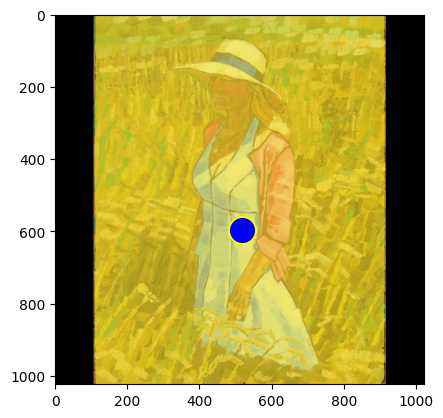

In [71]:
ax = plt.gca()
fig = plt.gcf()
implot = ax.imshow(image)
# sam_masks = sam_masks > predictor.model.mask_threshold
show_mask(th_masks.cpu().detach().numpy(), plt.gca())
show_points(input_point, input_label, plt.gca())

In [72]:
item = artwork_img.convert("RGB") 
inputs = preprocess(item).unsqueeze(0).to(device)
print(inputs.shape)
outputs = emb_model(inputs)

torch.Size([1, 3, 224, 224])


In [75]:
ort_session = onnxruntime.InferenceSession("sam_onnx_quantized_example.onnx") # you need to download this file from sam repo

In [77]:
# rand_x = np.random.randint(image.shape[0])
# rand_y = np.random.randint(image.shape[1])
    
# input_point = np.array([[rand_x, rand_y]])

onnx_coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
onnx_label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)

onnx_coord = predictor.transform.apply_coords(onnx_coord, image.shape[:2]).astype(np.float32)
# onnx_mask_input =
# onnx_has_mask_input = 

gt_inputs = {
    "image_embeddings": outputs.detach().cpu().numpy(), #,#torch.Tensor(image_embedding),# torch.randn(1, embed_dim, *embed_size, dtype=torch.float),
    "point_coords": np.array([[[10, 10]]], dtype=np.float32),
    "point_labels": np.array([[1]], dtype=np.float32),
    "mask_input":  np.zeros((1, 1, 256, 256), dtype=np.float32),
    "has_mask_input": np.zeros(1, dtype=np.float32),
    "orig_im_size": np.array(image.shape[:2], dtype=np.float32),
}

# pred_masks, _, low_res_logits = onnx_model(**gt_inputs)
pred_masks, _, low_res_logits = ort_session.run(None, gt_inputs)

th__pred_masks_masks = (pred_masks > predictor.model.mask_threshold)

In [78]:
for key, value in gt_inputs.items():
    print("key", key)
    print("value", value.shape)

key image_embeddings
value (1, 256, 64, 64)
key point_coords
value (1, 1, 2)
key point_labels
value (1, 1)
key mask_input
value (1, 1, 256, 256)
key has_mask_input
value (1,)
key orig_im_size
value (2,)


In [79]:
gt_inputs["point_labels"].shape

(1, 1)

In [80]:
pred_masks[pred_masks > 0 ]

array([0.5486413 , 2.0461366 , 1.8876766 , ..., 0.6177091 , 0.9201736 ,
       0.18529296], dtype=float32)

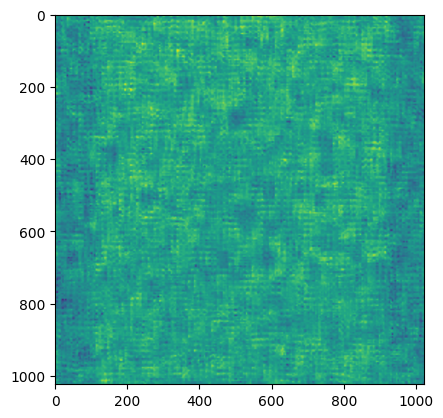

In [81]:
plt.imshow(pred_masks[0,0,...])

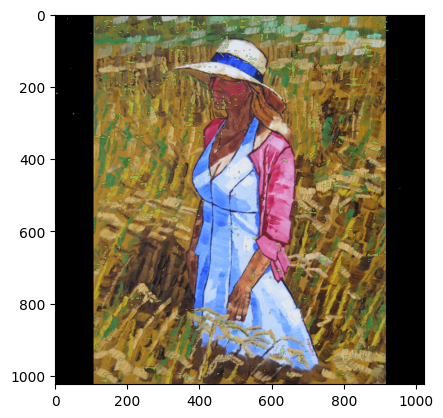

In [82]:
ax = plt.gca()
fig = plt.gcf()
implot = ax.imshow(image)
show_mask(th__pred_masks_masks, plt.gca())
# show_points(input_point, input_label, plt.gca())

In [ ]:
from onnxruntime.quantization.quantize import quantize_dynamic, QuantType
import onnx 

x = torch.empty(3, 224, 224, dtype=torch.float).to(device)

# Export the model
torch.onnx.export(emb_model,               # model being run
                  x,                         # model input (or a tuple for multiple inputs)
                  "resnet_predictor.onnx",   # where to save the model (can be a file or file-like object)
                  input_names = ['input_image'],   # the model's input names
                  output_names = ['embeddings'])


quantize_dynamic(
    model_input= "resnet_predictor.onnx",
    model_output="resnet_predictor_quant.onnx",
    optimize_model=True,
    per_channel=False,
    reduce_range=False,
    weight_type=QuantType.QUInt8,
)


# model = onnx.load("resnet_predictor_quant.onnx")

# print("input", model.graph.input)
# print("output name", model.graph.output[0].name)

In [ ]:
# https://coremltools.readme.io/docs/image-inputs

import coremltools as ct
from coremltools.models.neural_network import quantization_utils


x = torch.rand(3, 224, 224).to(device)

traced_model = torch.jit.trace(emb_model, x)

scale = 1/(0.226*255.0)
bias = [- 0.485/(0.229) , - 0.456/(0.224), - 0.406/(0.225)]

image_input = ct.ImageType(name="input_image",
                           shape=x.shape,
                           color_layout=ct.colorlayout.RGB,
                           scale=scale, 
                           bias=bias)

tensor_output = ct.TensorType(name="output",
                           shape=(256, 64, 64))


model = ct.convert(
    traced_model,
    inputs=[image_input])


# allowed values of nbits = 16, 8, 7, 6, ...., 1
quant_emb_model = quantization_utils.quantize_weights(model, 16)


quant_emb_model.save("resnet_predictor_quant_16_preprocess_3_2.mlmodel")

In [ ]:
# dummy coreml sam mask enc code 


In [ ]:
with open('tst2.rtf', 'r') as file:
    text = file.read()

In [ ]:
whitelist = set('1234567890.-[],;')
answer = ''.join(filter(whitelist.__contains__, text))

In [ ]:
answer = answer.replace("1125226390000-;10-;;255255255;255255255;313136;;;100000100000100000;120541228414131;1190016840144014401152084000593593593002423", "")

In [ ]:
answer

In [ ]:
pred_masks.max()

In [ ]:
spl_arr = answer.split(",")

In [ ]:
list_of_l = []

temp_list = []
for ind, item in enumerate(spl_arr):

    item = item.replace("[", "").replace("]", "")
        
    if ";" in item:
        prev, next_first = item.split(";")
        temp_list.append(float(prev))
        list_of_l.append(temp_list)
#         print(spl_arr[ind])

#         print(spl_arr[ind + 1])
                
        temp_list = [float(next_first.replace("13003", ""))]
    else:
        temp_list.append(float(item))   
    
list_of_l.append(temp_list)